<a id="1"></a>
# <p style="padding:10px;background-color:#753a88;margin:10;color:white;font-family:newtimeroman;font-size:100%;text-align:center;border-radius: 1px 1px;overflow:hidden;font-weight:50">Table of Contents</p>

1. For Alt 2 we were asked to come up with a hypothesis to investigate using a dataset.
2. The project must be completed using the Python programming language.
3. We were required to examine the raw data in order to ascertain usability.
4. We then had to analyze said data to find:
    1. Mean [Distrubution of Redshift](#Redshift)
    2. Frequency [Classes of Celestial bodies](#Celestial)
    3. Mode [Distrubution of Redshift](#Redshift)
    4. Median [Distrubution of Redshift](#Redshift)
6. This information is to be represented in graph form.
7. How would the analysis fo this information impact decision making.


# <p style="padding:10px;background-color:#753a88;margin:10;color:white;font-family:newtimeroman;font-size:100%;text-align:center;border-radius: 1px 1px;overflow:hidden;font-weight:50">Hypothesis</p>

What was the average redshift of celestial bodies observed during the sloan digital sky survey?

Alongside this I wondered which class of celestial body appeared most frequently in this dataset.

# <p style="padding:10px;background-color:#753a88;margin:10;color:white;font-family:newtimeroman;font-size:100%;text-align:center;border-radius: 1px 1px;overflow:hidden;font-weight:50">Additional analysis</p>

Alongside answering these questions I chose to do further analysis of the dataset

This includes;

Pearson correlations

Spearman correlations

And using various machine learning classification methods such as;

Support Vector Classifiers 

Random Forest Classifiers


*This image was taken from the greater sdss dataset*
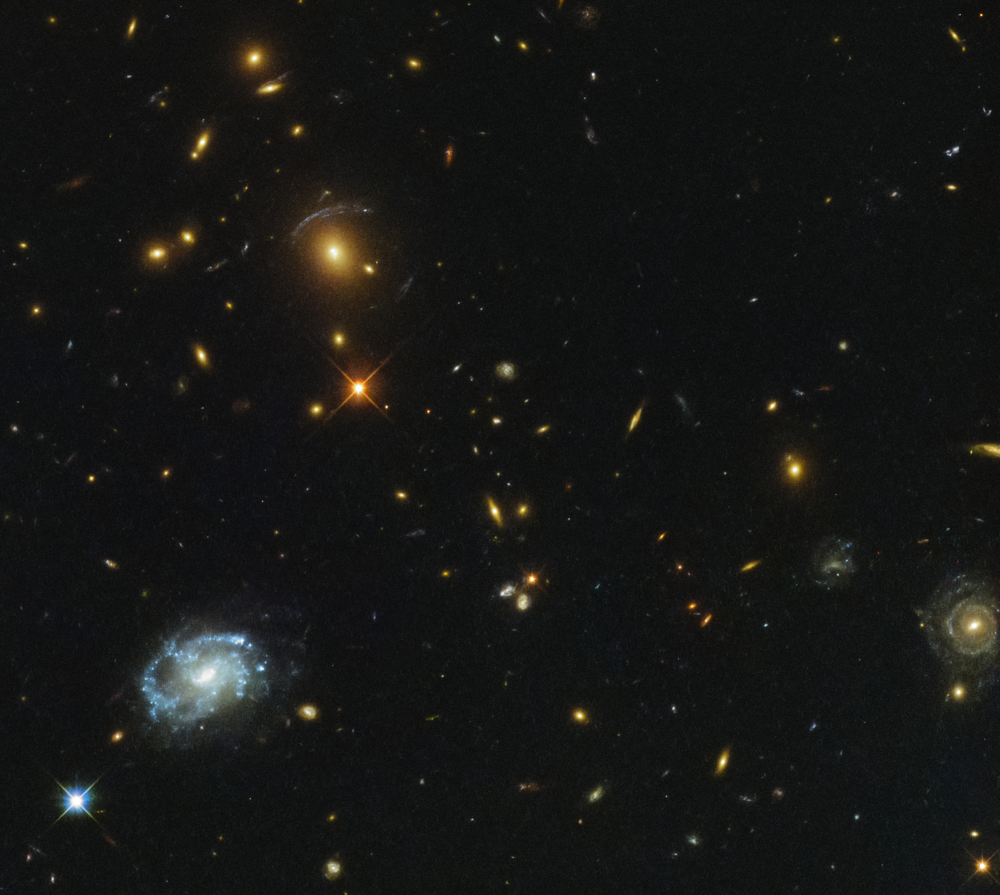
*By ESA/Hubble, CC BY 4.0, SDSS*

In [5]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as ex
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.offline as pyo

pyo.init_notebook_mode()
sns.set_style('darkgrid')

from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn import svm
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split

from yellowbrick.classifier import ConfusionMatrix
from yellowbrick.classifier import ClassPredictionError
from yellowbrick.classifier import ROCAUC
from yellowbrick.style import set_palette


from imblearn.over_sampling import SMOTE
from collections import Counter

fold = StratifiedKFold(n_splits=4, shuffle = True, random_state=62)

import warnings
warnings.filterwarnings('ignore')

ModuleNotFoundError: No module named 'catboost'

In [ ]:
df= pd.read_csv("../input/stellar-classification-dataset-sdss17/star_classification.csv")
df = df.drop(['obj_ID','alpha','delta','run_ID','rerun_ID','cam_col','field_ID','fiber_ID'], axis = 1)
df

,u,g,r,i,z,spec_obj_ID,class,redshift,plate,MJD
0,23.87882,22.27530,20.39501,19.16573,18.79371,6.543777e+18,GALAXY,0.634794,5812,56354
1,24.77759,22.83188,22.58444,21.16812,21.61427,1.176014e+19,GALAXY,0.779136,10445,58158
2,25.26307,22.66389,20.60976,19.34857,18.94827,5.152200e+18,GALAXY,0.644195,4576,55592
3,22.13682,23.77656,21.61162,20.50454,19.25010,1.030107e+19,GALAXY,0.932346,9149,58039
4,19.43718,17.58028,16.49747,15.97711,15.54461,6.891865e+18,GALAXY,0.116123,6121,56187
...,...,...,...,...,...,...,...,...,...,...
99995,22.16759,22.97586,21.90404,21.30548,20.73569,1.055431e+19,GALAXY,0.000000,9374,57749
99996,22.69118,22.38628,20.45003,19.75759,19.41526,8.586351e+18,GALAXY,0.404895,7626,56934
99997,21.16916,19.26997,18.20428,17.69034,17.35221,3.112008e+18,GALAXY,0.143366,2764,54535
99998,25.35039,21.63757,19.91386,19.07254,18.62482,7.601080e+18,GALAXY,0.455040,6751,56368


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 10 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   u            100000 non-null  float64
 1   g            100000 non-null  float64
 2   r            100000 non-null  float64
 3   i            100000 non-null  float64
 4   z            100000 non-null  float64
 5   spec_obj_ID  100000 non-null  float64
 6   class        100000 non-null  object 
 7   redshift     100000 non-null  float64
 8   plate        100000 non-null  int64  
 9   MJD          100000 non-null  int64  
dtypes: float64(7), int64(2), object(1)
memory usage: 7.6+ MB


In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
u,100000.0,2.198047e+01,3.176929e+01,-9.999000e+03,2.035235e+01,2.217914e+01,2.368744e+01,3.278139e+01
g,100000.0,2.053139e+01,3.175029e+01,-9.999000e+03,1.896523e+01,2.109983e+01,2.212377e+01,3.160224e+01
r,100000.0,1.964576e+01,1.854760e+00,9.822070e+00,1.813583e+01,2.012529e+01,2.104478e+01,2.957186e+01
i,100000.0,1.908485e+01,1.757895e+00,9.469903e+00,1.773228e+01,1.940514e+01,2.039650e+01,3.214147e+01
z,100000.0,1.866881e+01,3.172815e+01,-9.999000e+03,1.746068e+01,1.900460e+01,1.992112e+01,2.938374e+01
spec_obj_ID,100000.0,5.783882e+18,3.324016e+18,2.995191e+17,2.844138e+18,5.614883e+18,8.332144e+18,1.412694e+19
redshift,100000.0,5.766608e-01,7.307073e-01,-9.970667e-03,5.451684e-02,4.241733e-01,7.041543e-01,7.011245e+00
plate,100000.0,5.137010e+03,2.952303e+03,2.660000e+02,2.526000e+03,4.987000e+03,7.400250e+03,1.254700e+04
MJD,100000.0,5.558865e+04,1.808484e+03,5.160800e+04,5.423400e+04,5.586850e+04,5.677700e+04,5.893200e+04


**What the various Redshift values are**
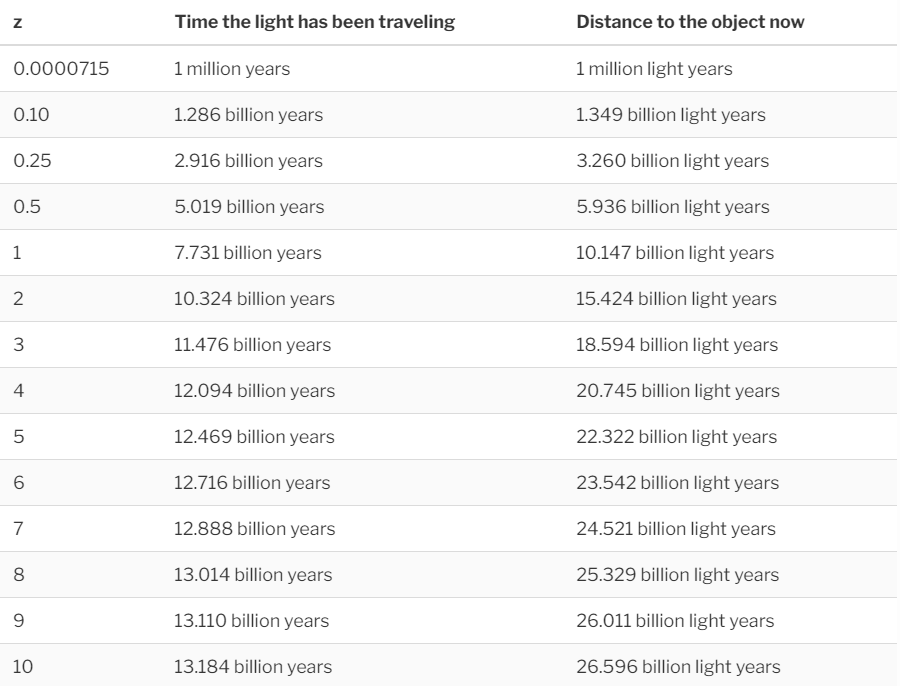
<a id="Redshift"></a>

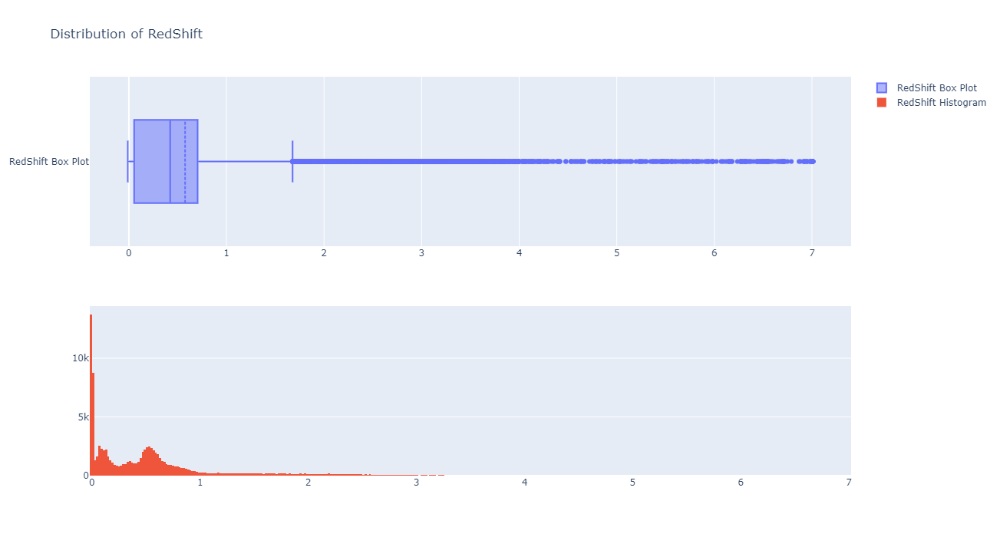

In [ ]:
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=df['redshift'],name='RedShift Box Plot',boxmean=True)
tr2=go.Histogram(x=df['redshift'],name='RedShift Histogram')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Distribution of RedShift")
fig.show()

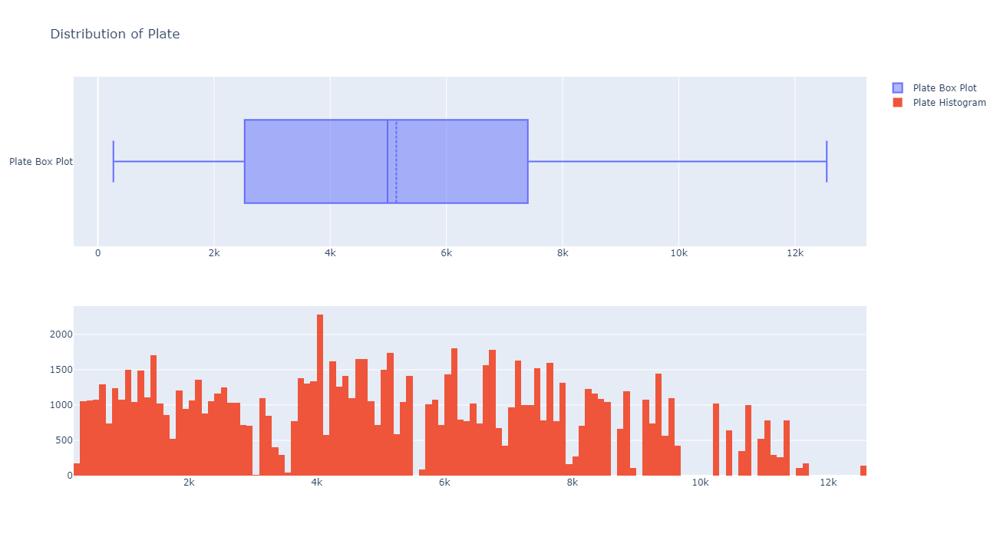

In [ ]:
fig = make_subplots(rows=2, cols=1)

tr1=go.Box(x=df['plate'],name='Plate Box Plot',boxmean=True)
tr2=go.Histogram(x=df['plate'],name='Plate Histogram')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700, width=1200, title_text="Distribution of Plate")
fig.show()

<a id= "Celestial"></a>

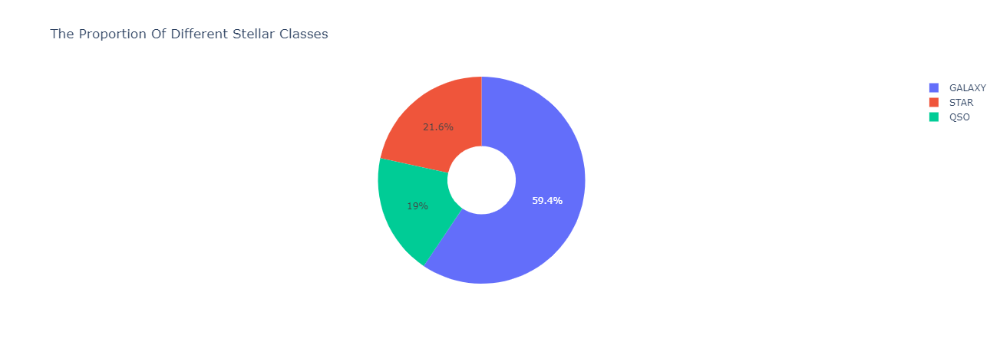

In [ ]:
ex.pie(df,names='class',title='The Proportion Of Different Stellar Classes',hole=.33)

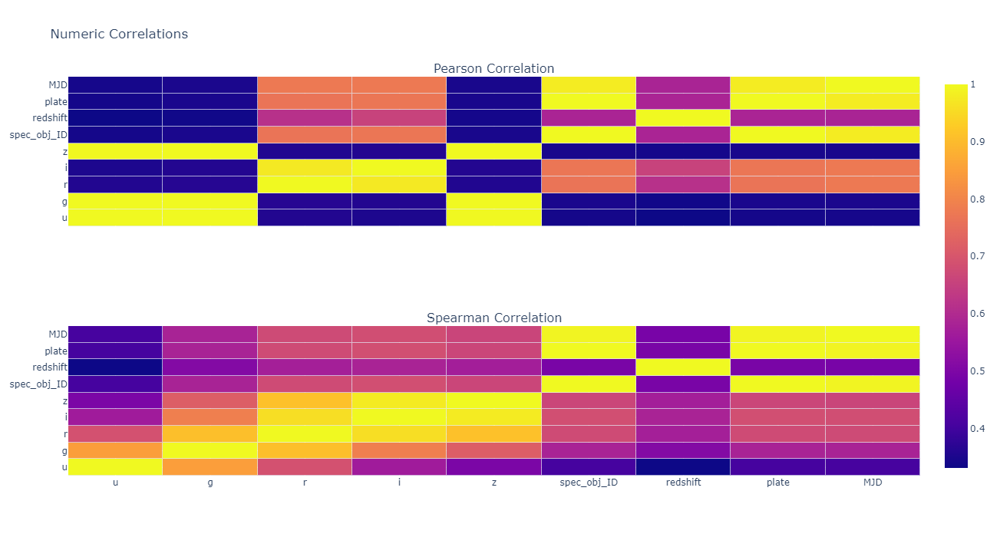

In [ ]:
fig = make_subplots(rows=2, cols=1,shared_xaxes=True,subplot_titles=('Pearson Correlation',  'Spearman Correlation'))
colorscale=     [[1.0              , "rgb(165,0,38)"],
                [0.8888888888888888, "rgb(215,48,39)"],
                [0.7777777777777778, "rgb(244,109,67)"],
                [0.6666666666666666, "rgb(253,174,97)"],
                [0.5555555555555556, "rgb(254,224,144)"],
                [0.4444444444444444, "rgb(224,243,248)"],
                [0.3333333333333333, "rgb(171,217,233)"],
                [0.2222222222222222, "rgb(116,173,209)"],
                [0.1111111111111111, "rgb(69,117,180)"],
                [0.0               , "rgb(49,54,149)"]]

s_val =df.corr('pearson')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
    go.Heatmap(x=s_col,y=s_idx,z=s_val,name='pearson',showscale=False,xgap=0.7,ygap=0.7),
    row=1, col=1
)


s_val =df.corr('spearman')
s_idx = s_val.index
s_col = s_val.columns
s_val = s_val.values
fig.add_trace(
    go.Heatmap(x=s_col,y=s_idx,z=s_val,xgap=0.7,ygap=0.7),
    row=2, col=1
)
fig.update_layout(
    hoverlabel=dict(
        bgcolor="white",
        font_size=16,
        font_family="Rockwell"
    )
)
fig.update_layout(height=700, width=900, title_text="Numeric Correlations")
fig.show()

In [ ]:
le = LabelEncoder()
df["class"] = le.fit_transform(df["class"])
df["class"] = df["class"].astype(int)

NameError: name 'LabelEncoder' is not defined

In [ ]:
x = df.drop(['class'], axis = 1)
y = df.loc[:,'class'].values

In [ ]:
sm = SMOTE(random_state=42)
x, y = sm.fit_resample(x, y)


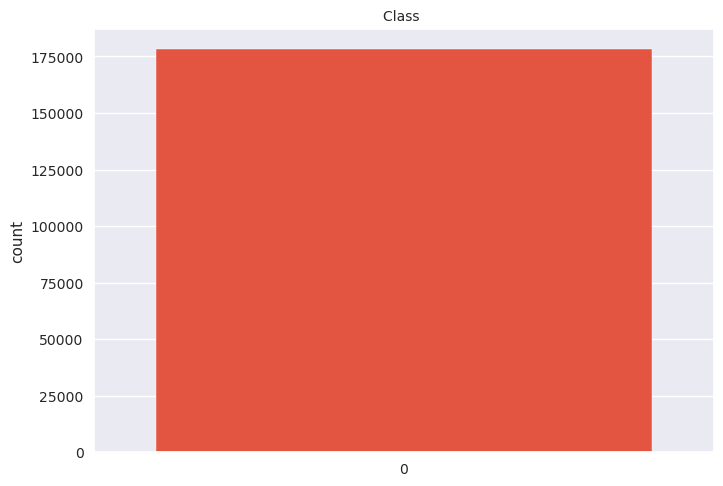

In [ ]:
sns.countplot(y, palette='CMRmap')
plt.title("Class ",fontsize=10)
plt.show()
# Woah this is fucking broken. Why?

In [ ]:
scaler = StandardScaler()
scaler.fit(x)
x = scaler.transform(x)

# Outliers

# SVC


In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.33, random_state = 42)

svm_clf = svm.SVC(kernel='rbf', C=1, random_state=0)
svm_clf.fit(x_train,y_train)
predicted = svm_clf.predict(x_test)
score = svm_clf.score(x_test, y_test)
svm_score_ = np.mean(score)

print('Accuracy : %.3f' % (svm_score_))

Accuracy : 0.967


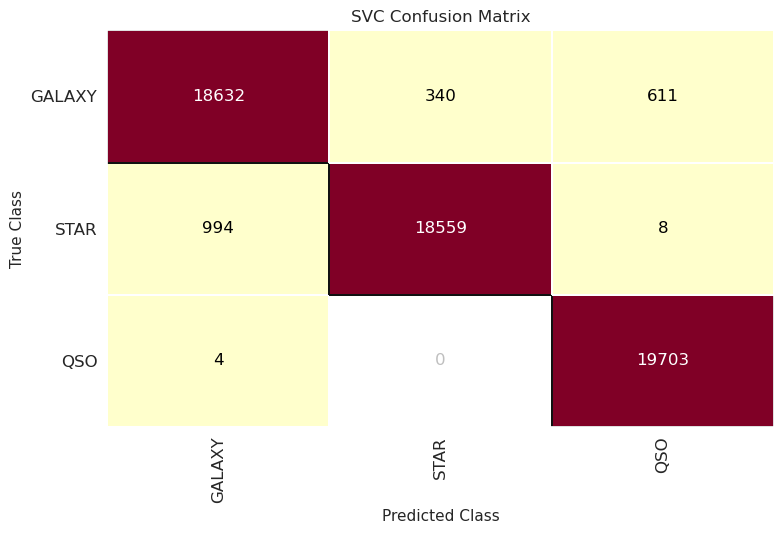

<AxesSubplot:title={'center':'SVC Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [ ]:
svm_cm = ConfusionMatrix(svm_clf, classes=['GALAXY','STAR','QSO'])

svm_cm.fit(x_train, y_train)
svm_cm.score(x_test, y_test)
svm_cm.show()

In [ ]:
print(classification_report(y_test, predicted))

              precision    recall  f1-score   support

           0       0.95      0.95      0.95     19583
           1       0.98      0.95      0.97     19561
           2       0.97      1.00      0.98     19707

    accuracy                           0.97     58851
   macro avg       0.97      0.97      0.97     58851
weighted avg       0.97      0.97      0.97     58851



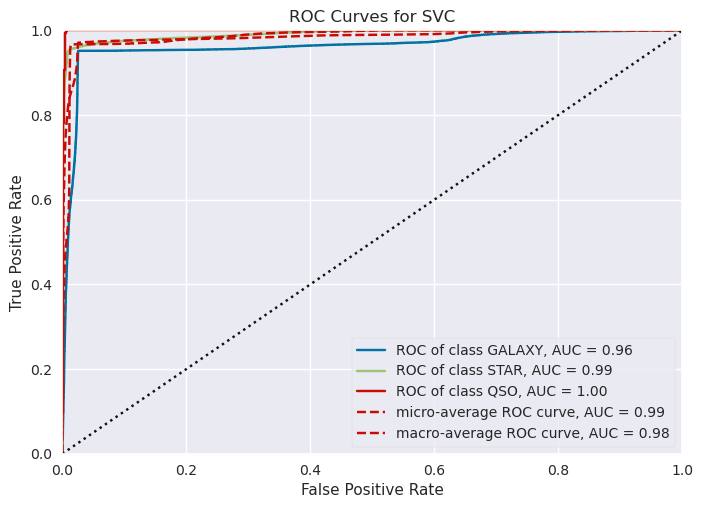

<AxesSubplot:title={'center':'ROC Curves for SVC'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [ ]:
visualizer = ROCAUC(svm_clf, classes=['GALAXY','STAR','QSO'])

visualizer.fit(x_train, y_train)
visualizer.score(x_test, y_test)
visualizer.show()    

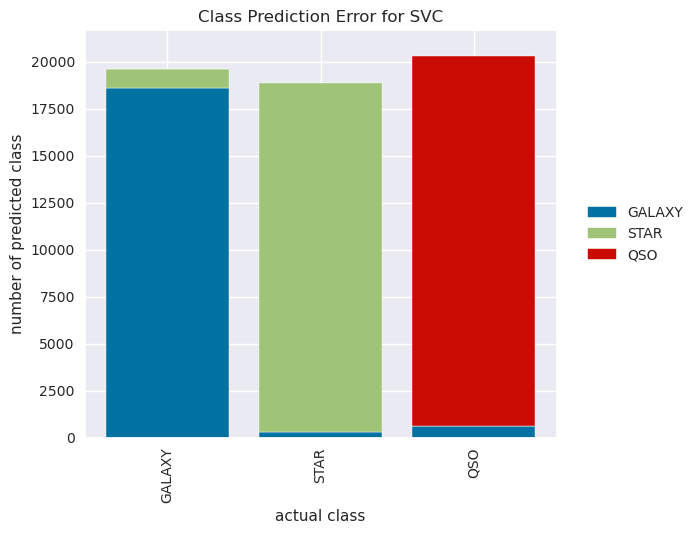

<AxesSubplot:title={'center':'Class Prediction Error for SVC'}, xlabel='actual class', ylabel='number of predicted class'>

In [ ]:
visualizer = ClassPredictionError(svm_clf, classes=['GALAXY','STAR','QSO'])

visualizer.fit(x_train, y_train)
visualizer.score(x_test, y_test)
visualizer.show()    



# Random Forest Classifier 

In [ ]:
r_forest = RandomForestClassifier()
r_forest.fit(x_train,y_train)
predicted = r_forest.predict(x_test)
score = r_forest.score(x_test, y_test)
rf_score_ = np.mean(score)

print('Accuracy : %.3f' % (rf_score_))

Accuracy : 0.983


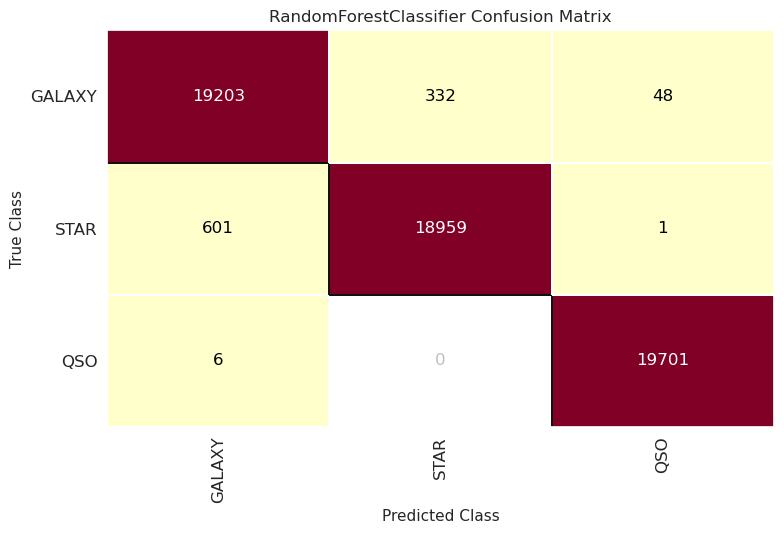

<AxesSubplot:title={'center':'RandomForestClassifier Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [ ]:
r_forest_cm = ConfusionMatrix(r_forest, classes=['GALAXY','STAR','QSO'])

r_forest_cm.fit(x_train, y_train)
r_forest_cm.score(x_test, y_test)
r_forest_cm.show()

In [ ]:
print(classification_report(y_test, predicted))

              precision    recall  f1-score   support

           0       0.97      0.98      0.97     19583
           1       0.98      0.97      0.98     19561
           2       1.00      1.00      1.00     19707

    accuracy                           0.98     58851
   macro avg       0.98      0.98      0.98     58851
weighted avg       0.98      0.98      0.98     58851



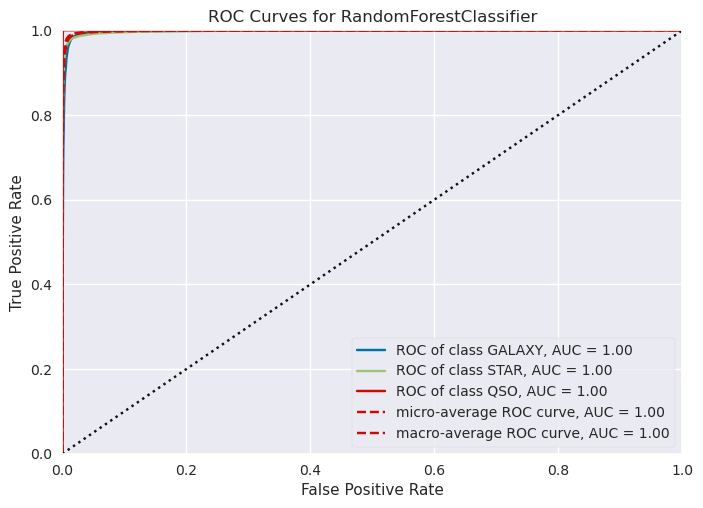

<AxesSubplot:title={'center':'ROC Curves for RandomForestClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [ ]:
visualizer = ROCAUC(r_forest, classes=["GALAXY", "STAR", "QSO"])

visualizer.fit(x_train, y_train)       
visualizer.score(x_test, y_test)        
visualizer.show() 

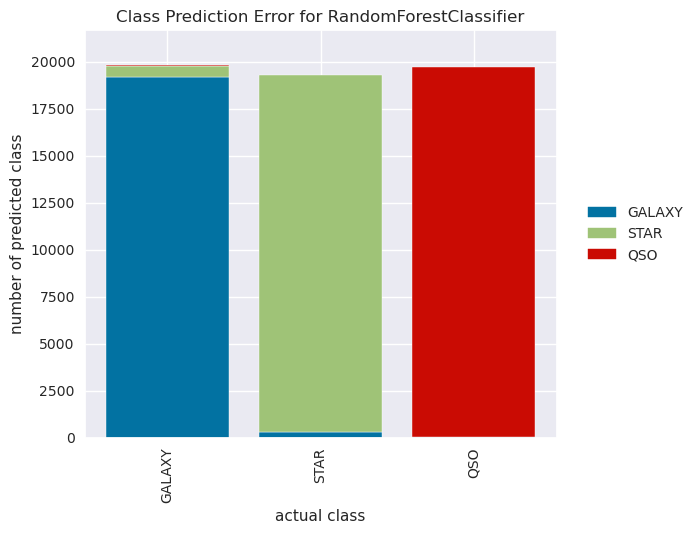

<AxesSubplot:title={'center':'Class Prediction Error for RandomForestClassifier'}, xlabel='actual class', ylabel='number of predicted class'>

In [ ]:
visualizer = ClassPredictionError(r_forest, classes=["GALAXY", "STAR", "QSO"])

visualizer.fit(x_train, y_train)        
visualizer.score(x_test, y_test)        
visualizer.show()   